In [2]:
import os
import torch
from transformers import ViTImageProcessor, ViTConfig, ViTForImageClassification
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import pandas as pd
from sklearn.model_selection import train_test_split
from torchvision import transforms
from imblearn.over_sampling import RandomOverSampler
from collections import Counter

In [ ]:
# Define paths
base_dir = '/kaggle/input/aptos2019-blindness-detection'
train_dir = "/kaggle/input/aptos2019-blindness-detection/train_images"
val_dir = "/kaggle/input/aptos2019-blindness-detection/test_images"
csv_file = os.path.join(base_dir, 'train.csv')

In [ ]:
# Load dataset
df = pd.read_csv(csv_file)

# Extract features (X) and labels (y)
X = df.iloc[:, 0].values.reshape(-1, 1)  # Image filenames
y = df.iloc[:, 1].values  # Labels

# Apply Random Oversampling to balance classes
oversampler = RandomOverSampler(sampling_strategy='auto', random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)

# Create new balanced dataframe
df_balanced = pd.DataFrame({
    'id_code': X_resampled.flatten(),
    'diagnosis': y_resampled
})

# Save balanced dataset for training
# Save balanced dataset for training in a writable directory
df_balanced.to_csv("/kaggle/working/train_balanced_version.csv", index=False)
# Print class distribution
print("Original class distribution:", Counter(y))
print("Balanced class distribution:", Counter(y_resampled))

In [ ]:
# Load the pre-trained processor
processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224')

# Load the configuration and modify it for 5 classes
config = ViTConfig.from_pretrained('google/vit-base-patch16-224')
config.num_labels = 5  # Set the number of classes to 5
config.id2label = {
    0: "No DR",
    1: "Mild DR",
    2: "Moderate DR",
    3: "Severe DR",
    4: "Proliferative DR"
}
config.label2id = {v: k for k, v in config.id2label.items()}

In [ ]:
# Load the model
model = ViTForImageClassification.from_pretrained(
    'google/vit-base-patch16-224',
    config=config,
    ignore_mismatched_sizes=True
)

In [ ]:
# Define transforms for training
train_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=30),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.RandomResizedCrop(size=(224, 224), scale=(0.8, 1.0)),
])


In [ ]:
# Dataset class
class APTOSDataset(Dataset):
    def __init__(self, csv_file, img_dir, processor, transform=None):
        self.data = pd.read_csv(csv_file)
        self.img_dir = img_dir
        self.processor = processor
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_name = os.path.join(self.img_dir, self.data.iloc[idx, 0] + '.png')
        image = Image.open(img_name).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        inputs = self.processor(images=image, return_tensors="pt")
        inputs = {k: v.squeeze(0) for k, v in inputs.items()}
        
        label = torch.tensor(self.data.iloc[idx, 1], dtype=torch.long)
        return {'pixel_values': inputs['pixel_values'], 'labels': label}

# Load balanced dataset
balanced_csv_file = "/kaggle/working/train_balanced_version.csv"
full_dataset = APTOSDataset(balanced_csv_file, train_dir, processor, transform=None)
train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(full_dataset, [train_size, val_size])

# Apply transforms
train_dataset.dataset.transform = train_transforms
val_dataset.dataset.transform = None


In [ ]:
# Define DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=4)

In [ ]:
from transformers import AdamW

# Define optimizer
optimizer = AdamW(model.parameters(), lr=5e-5, weight_decay=0.01)

# Define loss function
criterion = torch.nn.CrossEntropyLoss()

In [ ]:
import torch
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Training loop
def train_one_epoch(model, train_loader, optimizer, criterion, device):
    model.train()
    total_loss = 0
    correct = 0
    total = 0
    
    for batch in tqdm(train_loader, desc="Training"):
        optimizer.zero_grad()
        
        inputs = batch['pixel_values'].to(device)
        labels = batch['labels'].to(device)
        
        outputs = model(inputs).logits
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        correct += (outputs.argmax(dim=1) == labels).sum().item()
        total += labels.size(0)
    
    avg_loss = total_loss / len(train_loader)
    accuracy = correct / total * 100
    return avg_loss, accuracy

# Validation loop
def validate(model, val_loader, criterion, device):
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for batch in tqdm(val_loader, desc="Validating"):
            inputs = batch['pixel_values'].to(device)
            labels = batch['labels'].to(device)
            
            outputs = model(inputs).logits
            loss = criterion(outputs, labels)
            
            total_loss += loss.item()
            correct += (outputs.argmax(dim=1) == labels).sum().item()
            total += labels.size(0)
    
    avg_loss = total_loss / len(val_loader)
    accuracy = correct / total * 100
    return avg_loss, accuracy

In [ ]:
import time

num_epochs = 10  # Adjust as needed

for epoch in range(num_epochs):
    print(f"Epoch {epoch+1}/{num_epochs}")
    
    start_time = time.time()  # Start time
    
    train_loss, train_acc = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss, val_acc = validate(model, val_loader, criterion, device)
    
    end_time = time.time()  # End time
    epoch_time = end_time - start_time  # Compute time taken

    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
    print(f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%")
    print(f"Epoch {epoch+1} Time: {epoch_time:.2f} seconds\n")

In [ ]:
torch.save(model.state_dict(), "/kaggle/working/vit_dr_classification.pth")

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

In [ ]:
def get_predictions_and_labels(model, dataloader, device):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for batch in dataloader:
            inputs = batch['pixel_values'].to(device)
            labels = batch['labels'].cpu().numpy()  # Convert to numpy
            
            outputs = model(inputs).logits
            preds = torch.argmax(outputs, dim=1).cpu().numpy()  # Get predicted class
            
            all_preds.extend(preds)
            all_labels.extend(labels)

    return np.array(all_preds), np.array(all_labels)

In [ ]:
def plot_confusion_matrix(model, dataloader, device, class_names):
    preds, labels = get_predictions_and_labels(model, dataloader, device)
    
    # Compute confusion matrix
    cm = confusion_matrix(labels, preds)
    
    # Plot using seaborn
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

In [ ]:
class_names = ["No DR", "Mild", "Moderate", "Severe", "Proliferative DR"]  # Update if needed
plot_confusion_matrix(model, val_loader, device, class_names)

In [4]:
import torch

# Define device (Use GPU if available, else fallback to CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [10]:
import torch
from transformers import ViTForImageClassification

# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the model with correct number of classes (5 in your case)
model = ViTForImageClassification.from_pretrained(
    "google/vit-base-patch16-224", 
    num_labels=5,  
    ignore_mismatched_sizes=True  # Ignore classifier size mismatch
)

# Load weights
model_path = "/kaggle/input/vit-dr/pytorch/default/1/vit_dr_classification.pth"  # Update this path
state_dict = torch.load(model_path, map_location=device)
model.load_state_dict(state_dict, strict=False)  # `strict=False` ignores mismatches

# Move model to device
model.to(device)
model.eval()

print(" Model loaded successfully!")

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
<ipython-input-10-0955c98f330e>:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. Th

 Model loaded successfully!


In [11]:
from PIL import Image
import torch
from transformers import ViTImageProcessor

# Load the processor (same as used in training)
processor = ViTImageProcessor.from_pretrained("google/vit-base-patch16-224")

def preprocess_image(image_path):
    image = Image.open(image_path).convert("RGB")  # Load and convert image
    inputs = processor(images=image, return_tensors="pt")  # Preprocess image
    return inputs, image  # Return processed inputs & original image

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

In [12]:
import matplotlib.pyplot as plt

# Define class labels (Update if needed)
class_names = ["No DR", "Mild", "Moderate", "Severe", "Proliferative DR"]

def predict_and_visualize(image_path):
    inputs, image = preprocess_image(image_path)
    inputs = {k: v.to(device) for k, v in inputs.items()}  # Move to device

    with torch.no_grad():
        outputs = model(**inputs).logits  # Get logits
        predicted_class = torch.argmax(outputs, dim=1).item()  # Get class ID

    # Display image with prediction
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Predicted: {class_names[predicted_class]}")
    plt.show()

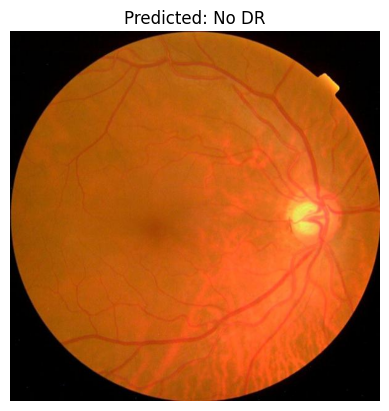

In [13]:
test_image_path = "/kaggle/input/eyepacs-aptos-messidor-diabetic-retinopathy/augmented_resized_V2/test/0/0a38b552372d-600.jpg"  # Update with your image path
predict_and_visualize(test_image_path)

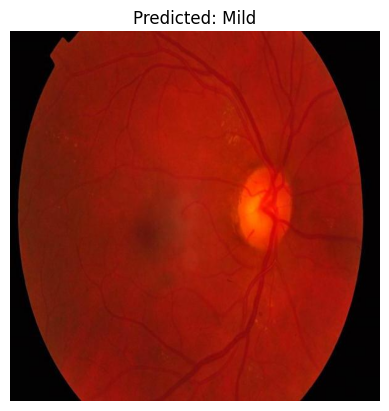

In [14]:
test_image_path = "/kaggle/input/eyepacs-aptos-messidor-diabetic-retinopathy/augmented_resized_V2/test/1/05a5183c92d0-600-RB.jpg"  # Update with your image path
predict_and_visualize(test_image_path)

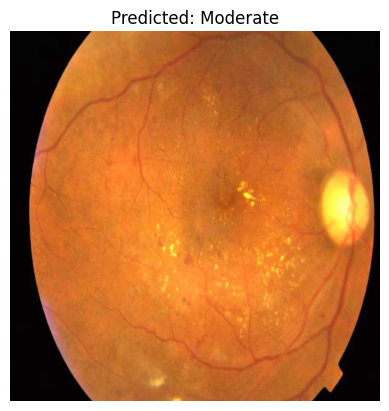

In [15]:
test_image_path = "/kaggle/input/eyepacs-aptos-messidor-diabetic-retinopathy/augmented_resized_V2/test/2/0c55d58bebaf-600-HBF.jpg"  # Update with your image path
predict_and_visualize(test_image_path)

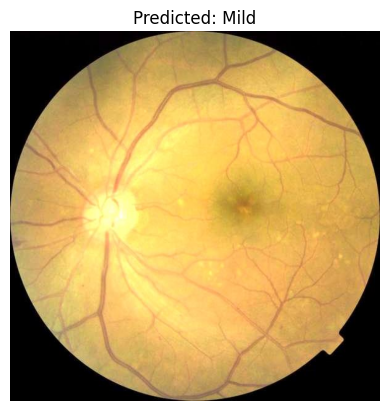

In [20]:
test_image_path = "/kaggle/input/eyepacs-aptos-messidor-diabetic-retinopathy/augmented_resized_V2/test/3/12000_left-600-HFA.jpg"  # Update with your image path
predict_and_visualize(test_image_path)

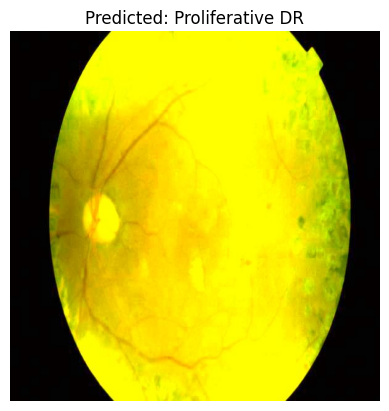

In [21]:
test_image_path = "/kaggle/input/eyepacs-aptos-messidor-diabetic-retinopathy/augmented_resized_V2/test/4/07122e268a1d-600-ALL.jpg"  # Update with your image path
predict_and_visualize(test_image_path)

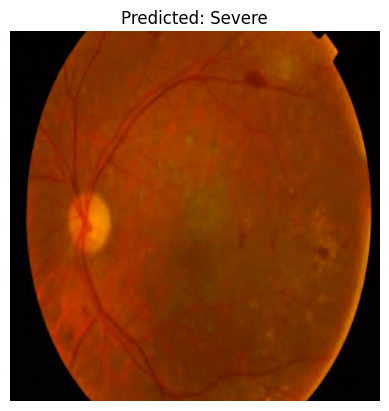

In [22]:
test_image_path = "/kaggle/input/eyepacs-aptos-messidor-diabetic-retinopathy/augmented_resized_V2/train/3/03c85870824c-600-SF.jpg"  # Update with your image path
predict_and_visualize(test_image_path)

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image: 2488_left.jpg -> Predicted Class: 1
Image: 26557_left.jpg -> Predicted Class: 1
Image: 28113_left.jpg -> Predicted Class: 1
Image: 30081_right.jpg -> Predicted Class: 1
Image: 26433_right.jpg -> Predicted Class: 1
Image: 16280_right.jpg -> Predicted Class: 1
Image: 34028_right.jpg -> Predicted Class: 1
Image: 36728_left.jpg -> Predicted Class: 1
Image: 37318_right.jpg -> Predicted Class: 1
Image: 4545_right.jpg -> Predicted Class: 1
Image: 2956_right.jpg -> Predicted Class: 1
Image: 2233_left.jpg -> Predicted Class: 1
Image: 3722_left.jpg -> Predicted Class: 1
Image: 30537_left.jpg -> Predicted Class: 1
Image: 35095_right.jpg -> Predicted Class: 1
Image: 24983_right.jpg -> Predicted Class: 1
Image: 3620_left.jpg -> Predicted Class: 1
Image: 38743_left.jpg -> Predicted Class: 1
Image: 52ae917fcea4-GF.jpg -> Predicted Class: 1
Image: 13345_right.jpg -> Predicted Class: 1


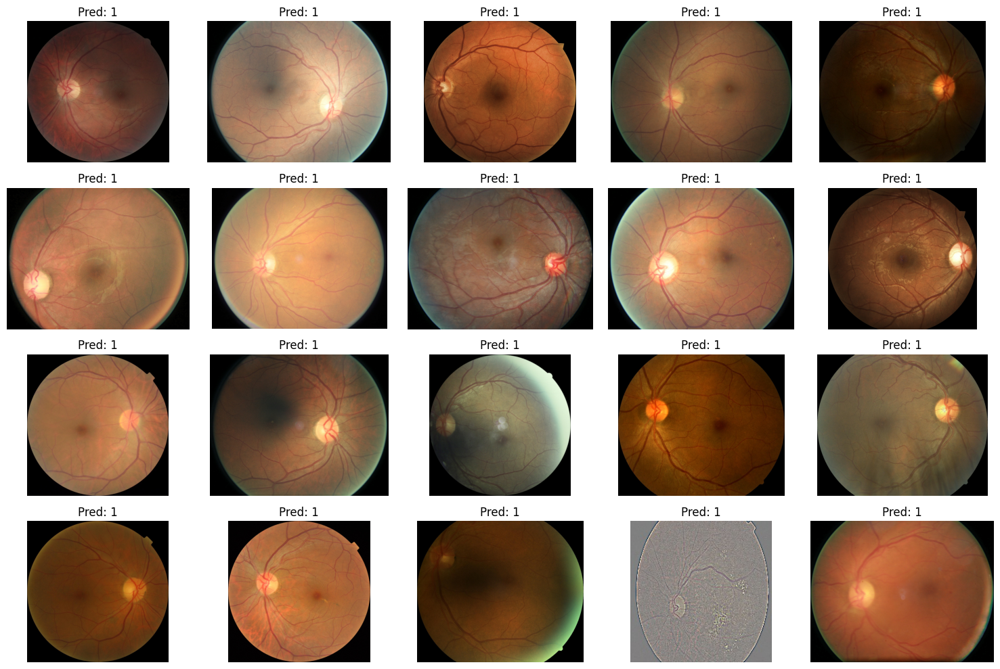

In [66]:

# Class 1 Prediction

import os
import random
import torch
from transformers import ViTFeatureExtractor, ViTForImageClassification
from PIL import Image
import matplotlib.pyplot as plt

# Set paths
image_dir = "/kaggle/input/eyepacs-aptos-messidor-diabetic-retinopathy/dr_unified_v2/dr_unified_v2/train/1"

# Load the model and processor
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ViTForImageClassification.from_pretrained(
    "google/vit-base-patch16-224",
    num_labels=5,
    ignore_mismatched_sizes=True  # Add this!
).to(device)
processor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224")

# Get 20 random images from the folder
all_images = [f for f in os.listdir(image_dir) if f.endswith((".png", ".jpg", ".jpeg"))]
random_images = random.sample(all_images, 20)

# Function to preprocess and predict
def predict_images(image_list):
    images = []
    filenames = []

    for img_name in image_list:
        img_path = os.path.join(image_dir, img_name)
        image = Image.open(img_path).convert("RGB")
        images.append(image)
        filenames.append(img_name)

    # Preprocess images
    inputs = processor(images=images, return_tensors="pt").to(device)

    # Model prediction
    with torch.no_grad():
        outputs = model(**inputs)
        preds = torch.argmax(outputs.logits, dim=-1).cpu().numpy()

    return filenames, preds

# Get predictions
filenames, predictions = predict_images(random_images)

# Display results
for i in range(20):
    print(f"Image: {filenames[i]} -> Predicted Class: {predictions[i]}")

# Plot some images with predictions
fig, axes = plt.subplots(4, 5, figsize=(15, 10))
axes = axes.flatten()

for idx, img_name in enumerate(random_images):
    img_path = os.path.join(image_dir, img_name)
    image = Image.open(img_path)
    axes[idx].imshow(image)
    axes[idx].set_title(f"Pred: {predictions[idx]}")
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image: 1801_right.jpg -> Predicted Class: 0
Image: 25490_left.jpg -> Predicted Class: 4
Image: 3968_right.jpg -> Predicted Class: 0
Image: 4042_right.jpg -> Predicted Class: 3
Image: 5555_right.jpg -> Predicted Class: 3
Image: 5238_left.jpg -> Predicted Class: 0
Image: 2323_left.jpg -> Predicted Class: 0
Image: 27342_right.jpg -> Predicted Class: 1
Image: 11488_left.jpg -> Predicted Class: 1
Image: 3402_right.jpg -> Predicted Class: 0
Image: 8262_left.jpg -> Predicted Class: 0
Image: 10663_right.jpg -> Predicted Class: 0
Image: 26763_left.jpg -> Predicted Class: 0
Image: 38210_left.jpg -> Predicted Class: 0
Image: 37133_right.jpg -> Predicted Class: 0
Image: 31754_left.jpg -> Predicted Class: 1
Image: 15460_left.jpg -> Predicted Class: 0
Image: 32304_left.jpg -> Predicted Class: 2
Image: 33171_left.jpg -> Predicted Class: 0
Image: 11457_right.jpg -> Predicted Class: 0


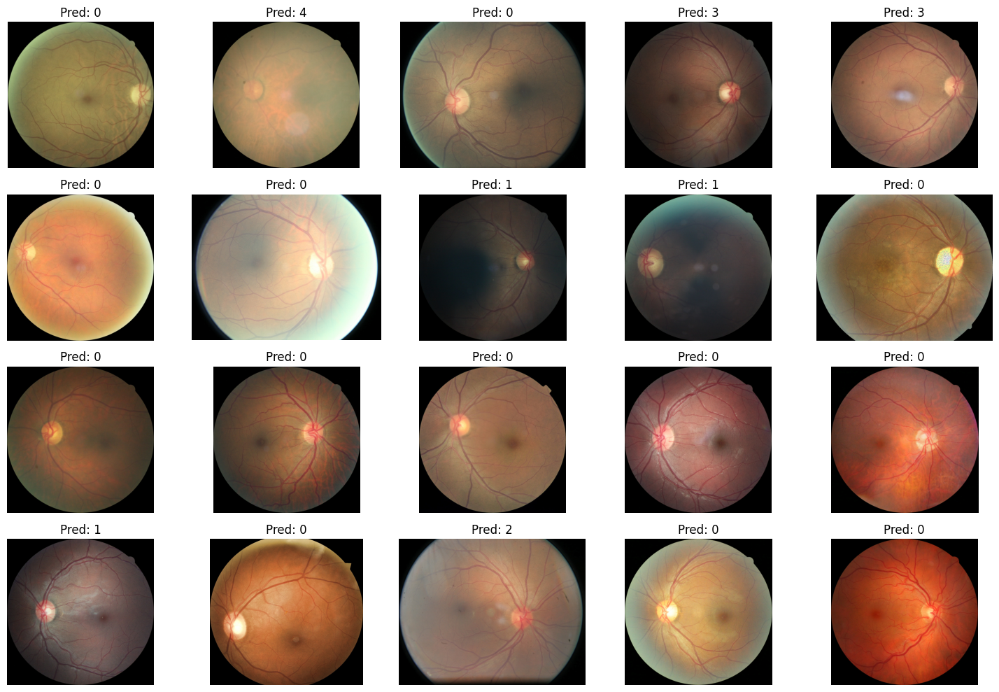

In [51]:
# Class 0 Prediction

import os
import random
import torch
from transformers import ViTFeatureExtractor, ViTForImageClassification
from PIL import Image
import matplotlib.pyplot as plt

# Set paths
image_dir = "/kaggle/input/eyepacs-aptos-messidor-diabetic-retinopathy/dr_unified_v2/dr_unified_v2/train/0"

# Load the model and processor
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ViTForImageClassification.from_pretrained(
    "google/vit-base-patch16-224",
    num_labels=5,
    ignore_mismatched_sizes=True  # Add this!
).to(device)
processor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224")

# Get 20 random images from the folder
all_images = [f for f in os.listdir(image_dir) if f.endswith((".png", ".jpg", ".jpeg"))]
random_images = random.sample(all_images, 20)

# Function to preprocess and predict
def predict_images(image_list):
    images = []
    filenames = []

    for img_name in image_list:
        img_path = os.path.join(image_dir, img_name)
        image = Image.open(img_path).convert("RGB")
        images.append(image)
        filenames.append(img_name)

    # Preprocess images
    inputs = processor(images=images, return_tensors="pt").to(device)

    # Model prediction
    with torch.no_grad():
        outputs = model(**inputs)
        preds = torch.argmax(outputs.logits, dim=-1).cpu().numpy()

    return filenames, preds

# Get predictions
filenames, predictions = predict_images(random_images)

# Display results
for i in range(20):
    print(f"Image: {filenames[i]} -> Predicted Class: {predictions[i]}")

# Plot some images with predictions
fig, axes = plt.subplots(4, 5, figsize=(15, 10))
axes = axes.flatten()

for idx, img_name in enumerate(random_images):
    img_path = os.path.join(image_dir, img_name)
    image = Image.open(img_path)
    axes[idx].imshow(image)
    axes[idx].set_title(f"Pred: {predictions[idx]}")
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image: 51cfeccaf40d-GF.jpg -> Predicted Class: 2
Image: 37984_left.jpg -> Predicted Class: 2
Image: 43682_left.jpg -> Predicted Class: 3
Image: 21022_left.jpg -> Predicted Class: 2
Image: 6848_left.jpg -> Predicted Class: 3
Image: 1259_right.jpg -> Predicted Class: 2
Image: ca360bec5851.jpg -> Predicted Class: 2
Image: 26390_left.jpg -> Predicted Class: 3
Image: 33820_left.jpg -> Predicted Class: 2
Image: 40018_left.jpg -> Predicted Class: 2
Image: 3a122851e526.jpg -> Predicted Class: 2
Image: 5e52c9fe676f.jpg -> Predicted Class: 2
Image: 5139_left.jpg -> Predicted Class: 2
Image: 4570_right.jpg -> Predicted Class: 3
Image: 37271_right.jpg -> Predicted Class: 2
Image: 28523_left.jpg -> Predicted Class: 3
Image: 28585_left.jpg -> Predicted Class: 2
Image: 000c1434d8d7.jpg -> Predicted Class: 2
Image: 33852_left.jpg -> Predicted Class: 2
Image: 7478_right.jpg -> Predicted Class: 3


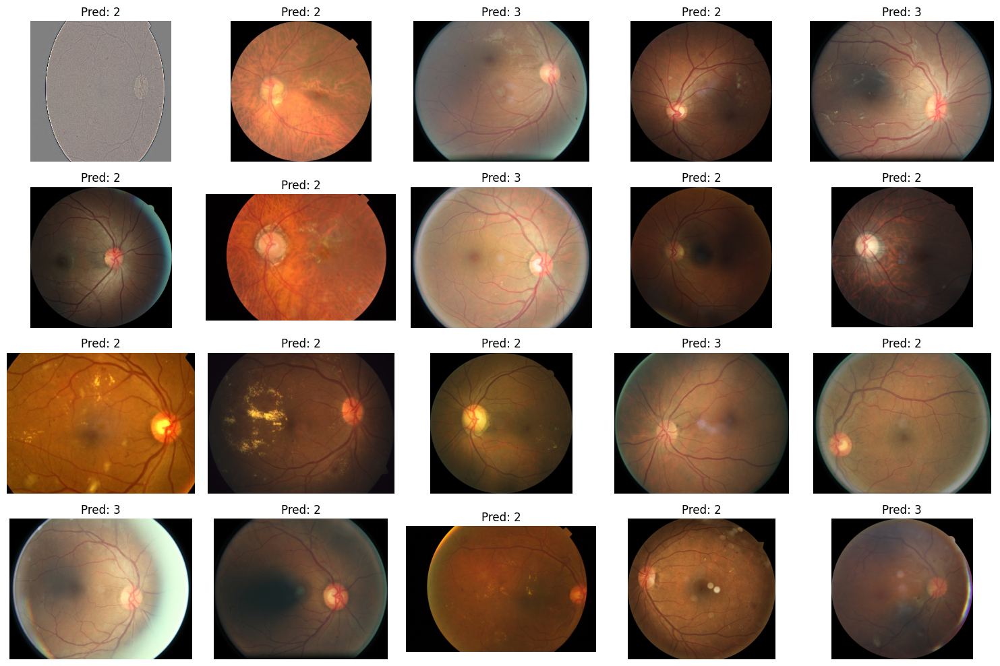

In [47]:
# Class 2 Prediction

import os
import random
import torch
from transformers import ViTFeatureExtractor, ViTForImageClassification
from PIL import Image
import matplotlib.pyplot as plt

# Set paths
image_dir = "/kaggle/input/eyepacs-aptos-messidor-diabetic-retinopathy/dr_unified_v2/dr_unified_v2/train/2"

# Load the model and processor
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ViTForImageClassification.from_pretrained(
    "google/vit-base-patch16-224",
    num_labels=5,
    ignore_mismatched_sizes=True  # Add this!
).to(device)
processor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224")

# Get 20 random images from the folder
all_images = [f for f in os.listdir(image_dir) if f.endswith((".png", ".jpg", ".jpeg"))]
random_images = random.sample(all_images, 20)

# Function to preprocess and predict
def predict_images(image_list):
    images = []
    filenames = []

    for img_name in image_list:
        img_path = os.path.join(image_dir, img_name)
        image = Image.open(img_path).convert("RGB")
        images.append(image)
        filenames.append(img_name)

    # Preprocess images
    inputs = processor(images=images, return_tensors="pt").to(device)

    # Model prediction
    with torch.no_grad():
        outputs = model(**inputs)
        preds = torch.argmax(outputs.logits, dim=-1).cpu().numpy()

    return filenames, preds

# Get predictions
filenames, predictions = predict_images(random_images)

# Display results
for i in range(20):
    print(f"Image: {filenames[i]} -> Predicted Class: {predictions[i]}")

# Plot some images with predictions
fig, axes = plt.subplots(4, 5, figsize=(15, 10))
axes = axes.flatten()

for idx, img_name in enumerate(random_images):
    img_path = os.path.join(image_dir, img_name)
    image = Image.open(img_path)
    axes[idx].imshow(image)
    axes[idx].set_title(f"Pred: {predictions[idx]}")
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image: ef26625121b3.jpg -> Predicted Class: 3
Image: 6630f8675a97-GF.jpg -> Predicted Class: 1
Image: 1fd5d860d4d7-GF.jpg -> Predicted Class: 0
Image: 30723_left.jpg -> Predicted Class: 3
Image: 13293_left.jpg -> Predicted Class: 0
Image: 16_right.jpg -> Predicted Class: 3
Image: 4688_right.jpg -> Predicted Class: 1
Image: 5dd2e26fc244.jpg -> Predicted Class: 3
Image: 33906_left.jpg -> Predicted Class: 3
Image: 14727_left.jpg -> Predicted Class: 3
Image: 12555_left.jpg -> Predicted Class: 3
Image: f2d2a0c92034.jpg -> Predicted Class: 3
Image: 2311_right.jpg -> Predicted Class: 3
Image: 211518c46162.jpg -> Predicted Class: 3
Image: 36759_left.jpg -> Predicted Class: 3
Image: 10954_right.jpg -> Predicted Class: 3
Image: 31902_right.jpg -> Predicted Class: 3
Image: 07122e268a1d.jpg -> Predicted Class: 3
Image: 32868_left.jpg -> Predicted Class: 1
Image: 9e3510963315-GF.jpg -> Predicted Class: 3


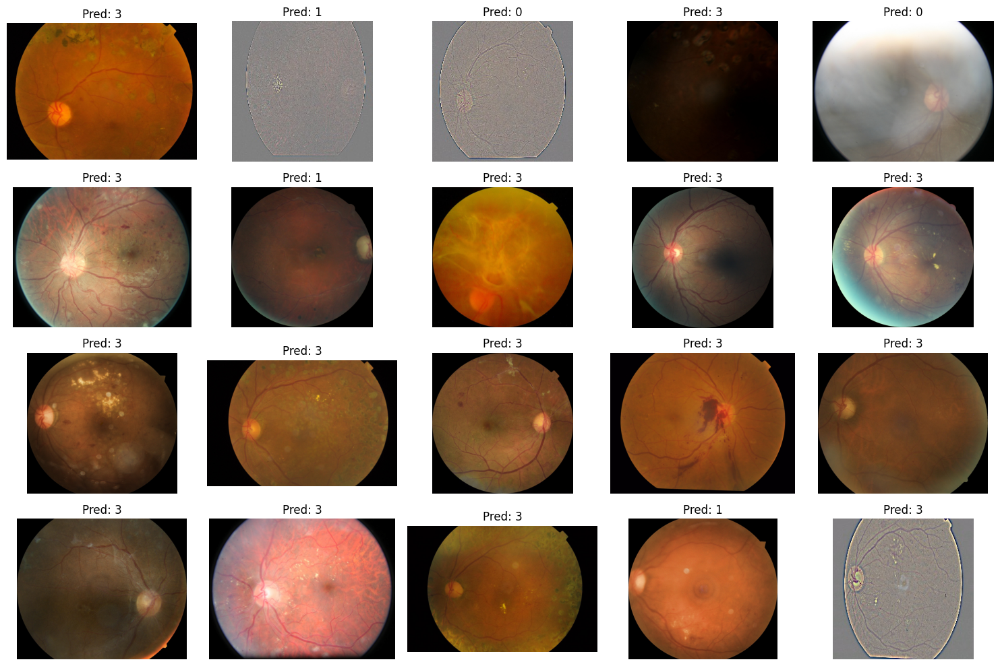

In [58]:
# Class 3 Prediction

import os
import random
import torch
from transformers import ViTFeatureExtractor, ViTForImageClassification
from PIL import Image
import matplotlib.pyplot as plt

# Set paths
image_dir = "/kaggle/input/eyepacs-aptos-messidor-diabetic-retinopathy/dr_unified_v2/dr_unified_v2/test/3"

# Load the model and processor
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ViTForImageClassification.from_pretrained(
    "google/vit-base-patch16-224",
    num_labels=5,
    ignore_mismatched_sizes=True  # Add this!
).to(device)
processor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224")

# Get 20 random images from the folder
all_images = [f for f in os.listdir(image_dir) if f.endswith((".png", ".jpg", ".jpeg"))]
random_images = random.sample(all_images, 20)

# Function to preprocess and predict
def predict_images(image_list):
    images = []
    filenames = []

    for img_name in image_list:
        img_path = os.path.join(image_dir, img_name)
        image = Image.open(img_path).convert("RGB")
        images.append(image)
        filenames.append(img_name)

    # Preprocess images
    inputs = processor(images=images, return_tensors="pt").to(device)

    # Model prediction
    with torch.no_grad():
        outputs = model(**inputs)
        preds = torch.argmax(outputs.logits, dim=-1).cpu().numpy()

    return filenames, preds

# Get predictions
filenames, predictions = predict_images(random_images)

# Display results
for i in range(20):
    print(f"Image: {filenames[i]} -> Predicted Class: {predictions[i]}")

# Plot some images with predictions
fig, axes = plt.subplots(4, 5, figsize=(15, 10))
axes = axes.flatten()

for idx, img_name in enumerate(random_images):
    img_path = os.path.join(image_dir, img_name)
    image = Image.open(img_path)
    axes[idx].imshow(image)
    axes[idx].set_title(f"Pred: {predictions[idx]}")
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([5]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([5, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Image: 14849_right-600-FA.jpg -> Predicted Class: 4
Image: 95e732e043a1-600-HB.jpg -> Predicted Class: 4
Image: 43384_left-600-ALL.jpg -> Predicted Class: 2
Image: 34934_left-600.jpg -> Predicted Class: 2
Image: 30416_right-600-HB.jpg -> Predicted Class: 4
Image: 29703_left-600-FSF.jpg -> Predicted Class: 4
Image: 4abca30b676b-GF-600-FSF.jpg -> Predicted Class: 4
Image: 15838_left-600-HB.jpg -> Predicted Class: 4
Image: 1a90fad9ffa2-GF-600-FS.jpg -> Predicted Class: 4
Image: 4462fba1d2a1-600-FS.jpg -> Predicted Class: 2
Image: 43374_right-600-ALL.jpg -> Predicted Class: 2
Image: 23074_left-600-FA.jpg -> Predicted Class: 4
Image: 30416_right-600-FSF.jpg -> Predicted Class: 4
Image: 13022_right-600-FS.jpg -> Predicted Class: 4
Image: 19965_left-600.jpg -> Predicted Class: 4
Image: 11874_left-600-FA.jpg -> Predicted Class: 4
Image: 39505_right-600-FA.jpg -> Predicted Class: 4
Image: 61e301bd3c25-600.jpg -> Predicted Class: 4
Image: 23125_right-600-HB.jpg -> Predicted Class: 4
Image: 41852

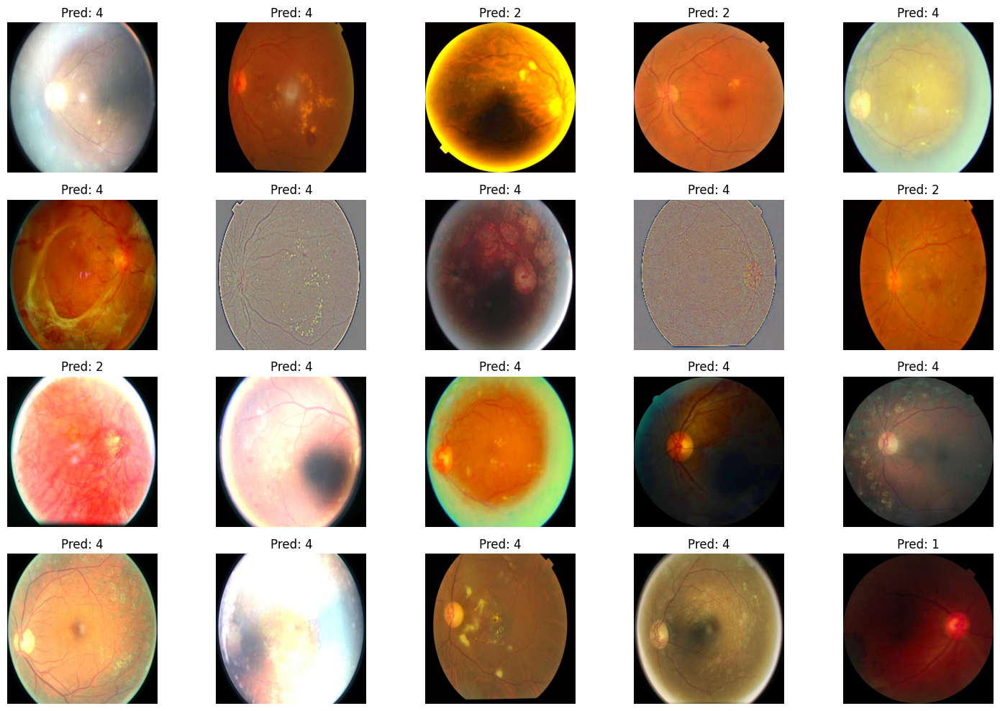

In [70]:
# Class 4 Prediction

import os
import random
import torch
from transformers import ViTFeatureExtractor, ViTForImageClassification
from PIL import Image
import matplotlib.pyplot as plt

# Set paths
image_dir = "/kaggle/input/eyepacs-aptos-messidor-diabetic-retinopathy/augmented_resized_V2/val/4"

# Load the model and processor
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ViTForImageClassification.from_pretrained(
    "google/vit-base-patch16-224",
    num_labels=5,
    ignore_mismatched_sizes=True  # Add this!
).to(device)
processor = ViTFeatureExtractor.from_pretrained("google/vit-base-patch16-224")

# Get 20 random images from the folder
all_images = [f for f in os.listdir(image_dir) if f.endswith((".png", ".jpg", ".jpeg"))]
random_images = random.sample(all_images, 20)

# Function to preprocess and predict
def predict_images(image_list):
    images = []
    filenames = []

    for img_name in image_list:
        img_path = os.path.join(image_dir, img_name)
        image = Image.open(img_path).convert("RGB")
        images.append(image)
        filenames.append(img_name)

    # Preprocess images
    inputs = processor(images=images, return_tensors="pt").to(device)

    # Model prediction
    with torch.no_grad():
        outputs = model(**inputs)
        preds = torch.argmax(outputs.logits, dim=-1).cpu().numpy()

    return filenames, preds

# Get predictions
filenames, predictions = predict_images(random_images)

# Display results
for i in range(20):
    print(f"Image: {filenames[i]} -> Predicted Class: {predictions[i]}")

# Plot some images with predictions
fig, axes = plt.subplots(4, 5, figsize=(15, 10))
axes = axes.flatten()

for idx, img_name in enumerate(random_images):
    img_path = os.path.join(image_dir, img_name)
    image = Image.open(img_path)
    axes[idx].imshow(image)
    axes[idx].set_title(f"Pred: {predictions[idx]}")
    axes[idx].axis("off")

plt.tight_layout()
plt.show()